<hr>

## Import Libraries and Load Dataset

<hr>

In [1]:
# YONGJIE PC
# downloaddir = 'C:/Users/yongj/Downloads/GAN/'
# datadir = 'C:/Users/yongj/Downloads/emnist-letters-train.csv'

# ## YONGJIE SCH PC
downloaddir = 'C:/Users/p2342377/Downloads/GAN/'
datadir = 'C:/Users/p2342377/Downloads/emnist-letters-train.csv'

# ## JOVAN SCH PC
# datadir = 'C:/Users/p2342377/Downloads/emnist-letters-train.csv'


In [2]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
print(gpus)
for gpu in gpus:
  tf.config.experimental.set_memory_growth(gpu, True)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
import os
import warnings
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# import visualkeras
import cv2

from keras import Sequential, Model
from keras.layers import Dense, Conv2D, Reshape, UpSampling2D, BatchNormalization, Activation, Input, LeakyReLU, ZeroPadding2D, Dropout, Flatten, Conv2DTranspose, Normalization, Rescaling
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l1, l2, l1_l2
from keras.datasets import mnist
import matplotlib.pyplot as plt
from tensorflow import keras
from keras.initializers import RandomNormal


os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' # Disable TF Warnings
tf.get_logger().setLevel('INFO')
warnings.filterwarnings("ignore")
seed=np.random.seed(69)
sns.set(style='darkgrid', palette='deep')

In [5]:
### WGAN
import numpy as np
import os
import matplotlib.pyplot as plt
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers import BatchNormalization, Activation, ZeroPadding2D, LeakyReLU
from keras.layers import UpSampling2D, Conv2D, Conv2DTranspose
from keras.models import Sequential, Model
import keras

## ACGAN
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate, LeakyReLU, BatchNormalization, Conv2D, Conv2DTranspose
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam, RMSprop
import matplotlib.pyplot as plt
import os

### CGAN
import numpy as np
import os
import matplotlib.pyplot as plt
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate
from keras.layers import BatchNormalization, Activation, ZeroPadding2D, LeakyReLU
from keras.layers import UpSampling2D, Conv2D, Conv2DTranspose
from keras.models import Sequential, Model
# from keras.optimizers import Adam
import keras


In [10]:
df = pd.read_csv(datadir)

<hr>

## Exploratory Data Analysis (EDA)

<hr>

### Splitting into labels and images

In [11]:
y1 = np.array(df.iloc[:,0].values)
x1 = np.array(df.iloc[:,1:].values)
x1 = np.array([np.rot90(np.flipud(sample.reshape(28, 28, 1)), k=3) for sample in x1])
print(y1.shape)
print(x1.shape)

(99039,)
(99039, 28, 28, 1)


In [7]:
number_to_letter = {}
for i in range(1, 27):
    number_to_letter[i] = chr(ord('a') + i - 1)
number_to_letter[-1] = 'nothing'

#### Looking at the Images

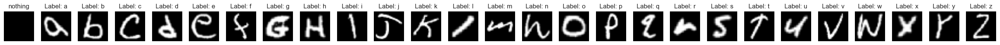

In [7]:
# SHow an image from each classes
fig,axes = plt.subplots(1,27,figsize=(26,26))
for i,ax in enumerate(axes.flat):
    if i == 0:
        ax.set_title(f'nothing')
        ax.imshow(x1[y1==-1][0], cmap='gray')
    else:
        ax.set_title(f'Label: {number_to_letter[i]}')
        ax.imshow(x1[y1==i][0], cmap='gray')
    ax.axis('off')  # Turn off the axis

plt.tight_layout()

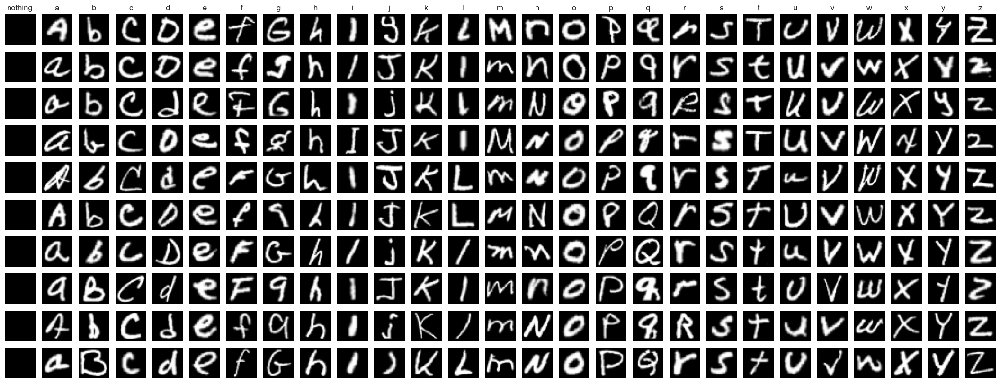

In [9]:
# Show 10 random image from each classes
fig,axes = plt.subplots(10,27,figsize=(27,10))
for i,ax in enumerate(axes.flat):
    if i%27 == 0:
        ax.imshow(x1[y1 == -1][np.random.choice(len(x1[y1 == -1]))], cmap='gray')
    else:
        ax.imshow(x1[y1==i%27][np.random.choice(len(x1[y1 == i%27]))], cmap='gray')
    ax.axis('off')  # Turn off the axis


# Add title to first row
axes[0,0].set_title(f'{number_to_letter[-1]}')
for i in range(1,27):
    axes[0,i].set_title(f'{number_to_letter[i%27]}')

##### <u>Observations</u>

1. **Variation in Class**:
   - The classes consist of both upper and lower case letters.

2. **Variation in handwriting**:
   - Handwriting for letters varies in slant, thickness, and style.

3. **Distinctive Classes**:
   - Some letters, such as 'c' and 'C', are difficult to distinguish as upper or lower case due to similar writing styles.
   - Other letters such as 'd' and 'D' are written in very distinct ways, making it easier to differentiate between their upper and lower case forms.


#### Getting the Average Imaging

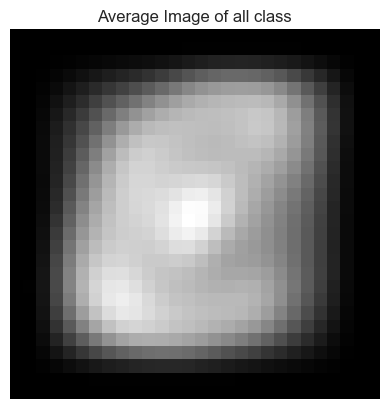

In [10]:
# OVerall average image
plt.title('Average Image of all class')
plt.imshow(np.mean(x1, axis=0), cmap='gray')
plt.axis('off')  # Turn off the axis
plt.show()

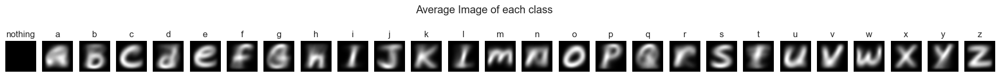

In [13]:
# Get average image of each classes
average_images = []
for i in range(27):
    if i == 0:
        i = -1
    average_images.append(np.mean(x1[y1==i], axis=0))

# Show average image of each classes
fig,axes = plt.subplots(1,27,figsize=(24,2))   

for i,ax in enumerate(axes.flat):
    ax.imshow(average_images[i], cmap='gray')
    ax.imshow(average_images[i], cmap='gray')
    ax.axis('off')  # Turn off the axis
    if i == 0:
        i = -1
    ax.set_title(f'{number_to_letter[i]}')

fig.suptitle('Average Image of each class')
plt.show()

##### <u>Observations</u>

- Letters such as 'x', 'b', 'c', and 'e' are well-defined and easily distinguishable.
- Letters such as 'g' and 'q' have a more blurred appearance, which is expected as the upper and lower case are more distinct.
- The model may have a harder time producing clear images of letters which have distinct looking upper case from the lower case letters

### Looking at distribution of images

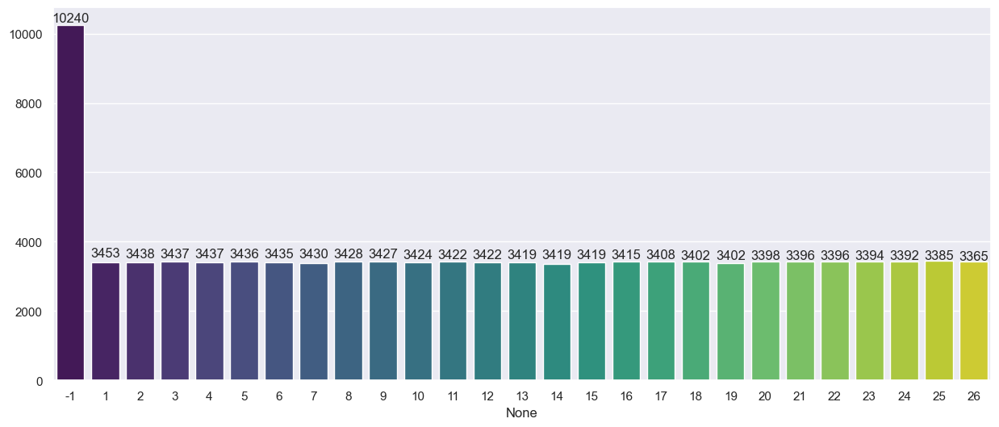

In [ ]:
# Bar plot of each letter
plt.figure(figsize=(15, 6))
values = pd.Series(y1).value_counts()
sns.barplot(x=values.index, y=values.values, palette='viridis')
# Add value on top of the bar
for i, value in enumerate(values.values):
    plt.text(i, value+100, f'{value}', ha='center')

#### Drop Images with -1 Class

In [12]:
y_train = y1[y1!=-1]
x_train = x1[y1!=-1]

In [ ]:
print(y_train.shape)
print(x_train.shape)

(88799,)
(88799, 28, 28, 1)


Max Count: 3453
Min Count: 3365


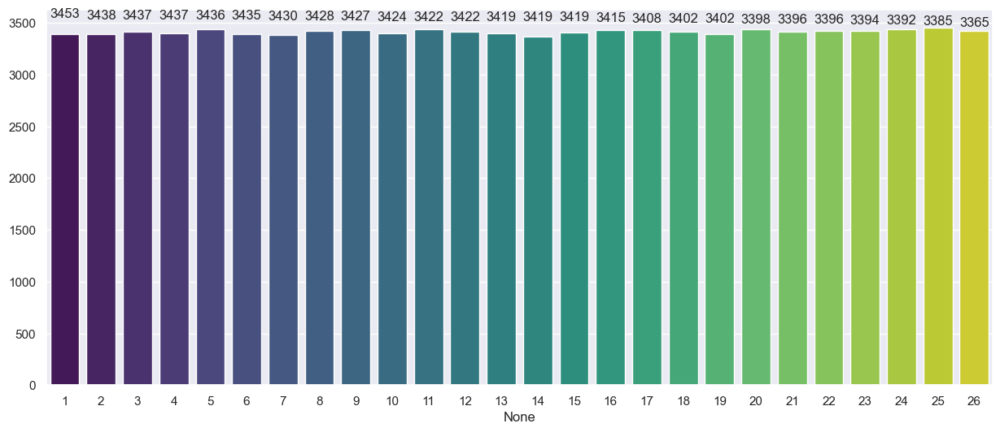

In [ ]:
# Bar plot of each letter
plt.figure(figsize=(15, 6))
values = pd.Series(y_train).value_counts()
sns.barplot(x=values.index, y=values.values, palette='viridis')
# Add value on top of the bar
for i, value in enumerate(values.values):
    plt.text(i, value+100, f'{value}', ha='center')
print(f"Max Count: {max(values)}")
print(f"Min Count: {min(values)}")

#### Pixel Distribution

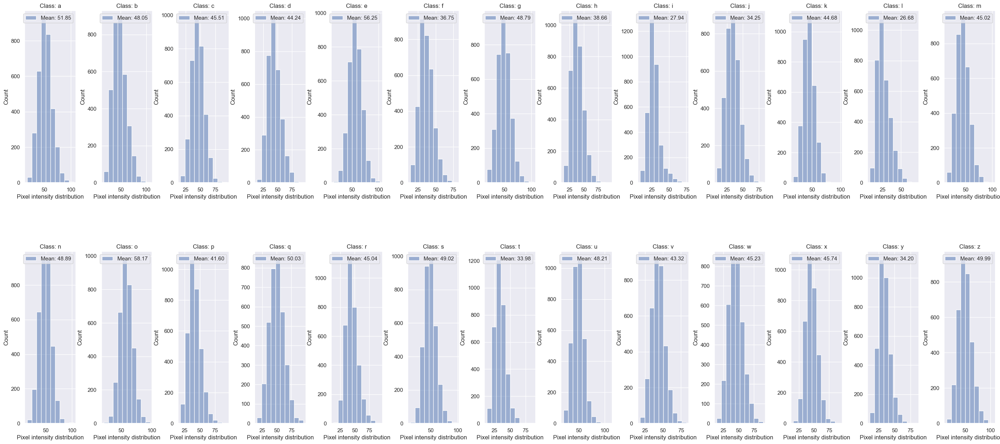

In [18]:
def plot_pixel_intensity_distribution(data, label, ax):
    brighness = np.mean(data, axis=(1, 2))
    sns.histplot(brighness, bins=10, ax=ax)
    ax.set_xlabel("Pixel intensity distribution")
    ax.set_title(f"Class: {label}")
    ax.legend([f"Mean: {np.mean(brighness):.2f}"])
    return ax

fig, axes = plt.subplots(2, 13, figsize=(35, 15))
plt.subplots_adjust(hspace=0.4, wspace=0.5)
for i in range(26):
    row = i // 13
    col = i % 13
    ax = plot_pixel_intensity_distribution(x1[y1 == i+1], number_to_letter[i+1], axes[row, col])

plt.show()

<hr>

## Data Preprocessing

<hr>

### Data Augmentation

In [13]:
def scale(images):
    images = images.astype('float32')
    images = (images / 127.5) - 1  # Scale to [-1, 1]
    return images

<hr>

## Building Baseline Model
<hr>

1. GAN Model 1 (DCGAN)
2. GAN Model 2 (cGAN)
3. GAN Model 3 (WGAN)
4. GAN Model 4 (ACGAN)
5. GAN Model 5 (BIGGAN/StyleGAN/PaperGAN) [Optional]

https://www.tensorflow.org/guide/keras/customizing_what_happens_in_fit#wrapping_up_an_end-to-end_gan_example

In [20]:
class DCGAN:

    def build_generator(self):
        model = Sequential(name="Generator")
        model.add(Dense(128 * 7 * 7, activation="relu", input_dim=self.latent_dim))
        model.add(Reshape((7, 7, 128)))

        model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(alpha=0.2))

        model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(alpha=0.2))

        model.add(Conv2D(self.channels, kernel_size=7, padding="same", activation="tanh"))
        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)
        
        return Model(noise, img)

    def build_discriminator(self):
        model = Sequential(name="Discriminator")
        model.add(
            Conv2D(
                128,
                kernel_size=3,
                strides=2,
                input_shape=self.img_shape,
                padding="same",
            )
        )
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.4))

        model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.4))

        model.add(Flatten())
        model.add(Dense(1, activation="sigmoid"))
        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)
        return Model(img, validity)

    def __init__(self, rows, cols, channels, dir, z=100):
        self.img_rows = rows
        self.img_cols = cols
        self.channels = channels
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = z
        optimizer = Adam(learning_rate=0.0001, beta_1=0.5)
        self.kl_divergence = keras.metrics.KLDivergence(name="kl_divergence")
        self.dir = dir

        self.discriminator = self.build_discriminator()
        self.discriminator.compile(
            loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"]
        )

        self.generator = self.build_generator()
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        self.discriminator.trainable = False
        valid = self.discriminator(img)
        self.combined = Model(z, valid)
        self.combined.compile(loss="binary_crossentropy", optimizer=optimizer)

    def train(self, train_images, epochs, batch_size=128, save_interval=50):
        X_train = train_images
        X_train = np.expand_dims(X_train, axis=3)
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        for epoch in range(epochs):
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            gen_imgs = self.generator.predict(noise)

            d_loss_real = self.discriminator.train_on_batch(imgs, valid)
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            g_loss = self.combined.train_on_batch(noise, valid)

            kl_loss = self.kl_divergence(imgs, gen_imgs)
            print(
                "%d [D loss: %f, acc.: %.2f%%] [G loss: %f] [KL div: %f]"
                % (epoch, d_loss[0], 100 * d_loss[1], g_loss, kl_loss)
            )

            if epoch % save_interval == 0:
                self.save_imgs(epoch)

    def save_imgs(self, epoch):
        r, c = 8, 13  # Number of rows and columns for the subplot grid
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise)

        fig, axs = plt.subplots(r, c)

                # Set the figure size
        fig.set_size_inches(10, 7)

        # Reduce the space between subplots
        plt.subplots_adjust(wspace=0.1, hspace=0.01)

        fig.suptitle(f"DCGAN: Generated digits (epoch {epoch})", fontsize=18)

        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap="gray")
                axs[i, j].axis("off")
                cnt += 1
        
        dir = self.dir + 'DCGAN/Images'
        os.makedirs(dir, exist_ok=True)
        fig.savefig(f"{dir}/dcgan_mnist_{epoch}.png" )

        plt.close()

In [22]:
dcgan = DCGAN(28,28,1, dir = downloaddir)
dcgan.train(train_images=scale(x_train),epochs=25000, batch_size=256, save_interval=500)

Model: "Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 14, 14, 128)       1280      
                                                                 
 leaky_re_lu_31 (LeakyReLU)  (None, 14, 14, 128)       0         
                                                                 
 dropout_17 (Dropout)        (None, 14, 14, 128)       0         
                                                                 
 conv2d_25 (Conv2D)          (None, 7, 7, 128)         147584    
                                                                 
 leaky_re_lu_32 (LeakyReLU)  (None, 7, 7, 128)         0         
                                                                 
 dropout_18 (Dropout)        (None, 7, 7, 128)         0         
                                                                 
 flatten_7 (Flatten)         (None, 6272)            

In [10]:
class CGAN:
    def build_generator(self):
        model = Sequential(name="Generator")
        model.add(Dense(128 * 7 * 7, activation="relu", input_dim=self.latent_dim + self.num_classes, ) )
        model.add(Reshape((7, 7, 128)))

        model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(alpha=0.2))

        model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(alpha=0.2))

        model.add(Conv2D(self.channels, kernel_size=7, padding="same", activation="tanh"))
        model.summary()

        noise = Input(shape=(self.latent_dim,))
        label = Input(shape=(self.num_classes,), dtype="float32")
        model_input = Concatenate()([noise, label])
        img = model(model_input)

        return Model([noise, label], img)

    def build_discriminator(self):
        model = Sequential(name="Discriminator")

        model.add(
            Conv2D(
                128,
                kernel_size=3,
                strides=2,
                input_shape=(self.img_rows, self.img_cols, self.channels + 1),
                padding="same",))
        
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.4))

        model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.4))

        model.add(Flatten())
        model.add(Dense(1, activation="sigmoid"))
        model.summary()

        img = Input(shape=self.img_shape)
        label = Input(shape=(self.num_classes,), dtype="float32")
        label_embedding = Dense(np.prod(self.img_shape))(label)
        label_embedding = Reshape(self.img_shape)(label_embedding)

        model_input = Concatenate(axis=-1)([img, label_embedding])

        validity = model(model_input)

        return Model([img, label], validity)

    def __init__(self, rows, cols, channels, num_classes, dir, z=100):
        self.img_rows = rows
        self.img_cols = cols
        self.channels = channels
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = z
        self.num_classes = num_classes
        self.dir = dir

        optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
        self.kl_divergence = keras.metrics.KLDivergence(name="kl_divergence")

        self.discriminator = self.build_discriminator()
        self.discriminator.compile(
            loss="binary_crossentropy", optimizer=optimizer, metrics=["accuracy"]
        )

        self.generator = self.build_generator()

        noise = Input(shape=(self.latent_dim,))
        label = Input(shape=(self.num_classes,))
        img = self.generator([noise, label])

        self.discriminator.trainable = False
        valid = self.discriminator([img, label])

        self.combined = Model([noise, label], valid)
        self.combined.compile(loss="binary_crossentropy", optimizer=optimizer)

    def train(
        self, train_images, train_labels, epochs, batch_size=128, save_interval=50
    ):
        X_train = train_images
        X_train = np.expand_dims(X_train, axis=3)

        # Adjust train_labels to be zero-indexed
        train_labels_zero_indexed = train_labels - 1
        y_train = tf.keras.utils.to_categorical(
            train_labels_zero_indexed, num_classes=self.num_classes
        )

        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        for epoch in range(epochs):
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs, labels = X_train[idx], y_train[idx]

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            gen_imgs = self.generator.predict([noise, labels])

            d_loss_real = self.discriminator.train_on_batch([imgs, labels], valid)
            d_loss_fake = self.discriminator.train_on_batch([gen_imgs, labels], fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            g_loss = self.combined.train_on_batch([noise, labels], valid)

            kl_loss = self.kl_divergence(imgs, gen_imgs)
            print(
                "%d [D loss: %f, acc.: %.2f%%] [G loss: %f] [KL div: %f]"
                % (epoch, d_loss[0], 100 * d_loss[1], g_loss, kl_loss)
            )

            if epoch % save_interval == 0:
                self.save_imgs(epoch)

    def save_imgs(self, epoch):
        r, c = 8, 13  # Number of rows and columns for the subplot grid
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))

        # Generate labels for the top half (first 5 rows)
        top_labels = np.tile(np.arange(13), (4, 1)).flatten()

        # Generate labels for the bottom half (last 5 rows)
        bottom_labels = np.tile(np.arange(13, 26), (4, 1)).flatten()

        # Combine top and bottom labels
        sampled_labels = np.concatenate((top_labels, bottom_labels))
        sampled_labels = tf.keras.utils.to_categorical(
            sampled_labels, num_classes=self.num_classes
        )

        gen_imgs = self.generator.predict([noise, sampled_labels])

        fig, axs = plt.subplots(r, c)
        
        # Set the figure size
        fig.set_size_inches(10, 7)

        # Reduce the space between subplots
        plt.subplots_adjust(wspace=0.1, hspace=0.01)

        fig.suptitle(f"CGAN: Generated digits (epoch {epoch})", fontsize=18)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap="gray")
                axs[i, j].axis("off")
                cnt += 1
                
        dir = self.dir + 'CGAN/Images'
        os.makedirs(dir, exist_ok=True)
        fig.savefig(f"{dir}/cgan_mnist_{epoch}.png" )

        plt.close()

In [11]:
cgan = CGAN(28, 28, 1, 26, dir = downloaddir)
cgan.train(
    train_images=scale(x_train),
    train_labels=y_train,
    epochs=25000,
    batch_size=256,
    save_interval=500,
)

Model: "Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 14, 14, 128)       2432      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 14, 14, 128)       0         
                                                                 
 dropout (Dropout)           (None, 14, 14, 128)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 7, 7, 128)         147584    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 7, 7, 128)         0         
                                                                 
 dropout_1 (Dropout)         (None, 7, 7, 128)         0         
                                                                 
 flatten (Flatten)           (None, 6272)            

KeyboardInterrupt: 

In [33]:
class ACGAN:
    def build_generator(self):
        model = Sequential(name="Generator")

        model.add(
            Dense(
                128 * 7 * 7,
                activation="relu",
                input_dim=self.latent_dim + self.num_classes,
            )
        )
        model.add(Reshape((7, 7, 128)))

        model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(alpha=0.2))

        model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(alpha=0.2))

        model.add(
            Conv2D(self.channels, kernel_size=7, padding="same", activation="tanh")
        )
        model.summary()

        noise = Input(shape=(self.latent_dim,))
        label = Input(shape=(self.num_classes,), dtype="float32")
        model_input = Concatenate()([noise, label])

        img = model(model_input)

        return Model([noise, label], img)

    def build_discriminator(self):
        img = Input(shape=self.img_shape)
        
        model = Sequential()
        model.add(
            Conv2D(
                128,
                kernel_size=3,
                strides=2,
                input_shape=self.img_shape,
                padding="same",
            )
        )
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.4))

        model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.4))

        model.add(Flatten())

        features = model(img)

        # Adversarial output
        validity = Dense(1, activation="sigmoid")(features)

        # Auxiliary output (class prediction)
        label = Dense(self.num_classes, activation="softmax")(features)

        return Model(img, [validity, label])

    def __init__(self, rows, cols, channels, num_classes, dir, z=100):
        self.img_rows = rows
        self.img_cols = cols
        self.channels = channels
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = z
        self.num_classes = num_classes
        self.dir = dir
        self.kl_divergence = keras.metrics.KLDivergence(name="kl_divergence")

        optimizer = Adam(learning_rate=0.0002, beta_1=0.5)

        self.discriminator = self.build_discriminator()
        self.discriminator.compile(
            loss=['binary_crossentropy', 'categorical_crossentropy'],
            optimizer=optimizer,
            metrics=["accuracy"]
        )

        self.generator = self.build_generator()

        noise = Input(shape=(self.latent_dim,))
        label = Input(shape=(self.num_classes,))
        img = self.generator([noise, label])

        self.discriminator.trainable = False
        valid, target_label = self.discriminator(img)

        self.combined = Model([noise, label], [valid, target_label])
        self.combined.compile(
            loss=['binary_crossentropy', 'categorical_crossentropy'], optimizer=optimizer
        )

    def train(
        self, train_images, train_labels, epochs, batch_size=128, save_interval=50
    ):
        X_train = train_images
        X_train = np.expand_dims(X_train, axis=3)
        y_train = train_labels - 1  # Ensure zero indexing if necessary
        y_train = tf.keras.utils.to_categorical(y_train, num_classes=self.num_classes)

        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        for epoch in range(epochs):
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs, labels = X_train[idx], y_train[idx]

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            gen_labels = np.random.randint(0, self.num_classes, batch_size)
            gen_labels = tf.keras.utils.to_categorical(gen_labels, num_classes=self.num_classes)
            gen_imgs = self.generator.predict([noise, gen_labels])

            d_loss_real = self.discriminator.train_on_batch(imgs, [valid, labels])
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, [fake, gen_labels])
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            sampled_labels = np.random.randint(0, self.num_classes, batch_size)
            sampled_labels = tf.keras.utils.to_categorical(sampled_labels, num_classes=self.num_classes)
            valid = np.ones((batch_size, 1))

            g_loss = self.combined.train_on_batch([noise, sampled_labels], [valid, sampled_labels])

            kl_loss = self.kl_divergence(imgs, gen_imgs)

            print(
                "%d [D loss: %f, acc.: %.2f%%] [G loss: %f] [KL div: %f]"
                % (epoch, d_loss[0], 100 * d_loss[3], g_loss[0], kl_loss)
            )

            if epoch % save_interval == 0:
                self.save_imgs(epoch)

    def save_imgs(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))

        sampled_labels = np.tile(
            np.arange(0, self.num_classes), r * c // self.num_classes + 1
        )[: r * c]
        sampled_labels = tf.keras.utils.to_categorical(
            sampled_labels, num_classes=self.num_classes
        )

        gen_imgs = self.generator.predict([noise, sampled_labels])

        fig, axs = plt.subplots(r, c)
        fig.suptitle(f"ACGAN: Generated digits (epoch {epoch})", fontsize=12)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap="gray")
                axs[i, j].axis("off")
                cnt += 1
                
        dir = self.dir + 'ACGAN/Images'
        os.makedirs(dir, exist_ok=True)
        fig.savefig(f"{dir}/acgan_mnist_{epoch}.png" )

        plt.close()

In [36]:
acgan = ACGAN(28, 28, 1, 26, dir = downloaddir)
acgan.train(
    train_images=scale(x_train),
    train_labels=y_train,
    epochs=25000,
    batch_size=256,
    save_interval=50,
)

In [51]:
class WGAN:
    def build_generator(self):
        model = Sequential(name="Generator")
        model.add(Dense(128 * 7 * 7, activation="relu", input_dim=self.latent_dim))
        model.add(Reshape((7, 7, 128)))
        model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(alpha=0.2))
        model.add(
            Conv2D(self.channels, kernel_size=7, padding="same", activation="tanh")
        )
        model.summary()
        noise = Input(shape=(self.latent_dim,))
        img = model(noise)
        return Model(noise, img)

    def build_critic(self):
        model = Sequential(name="Critic")
        model.add(
            Conv2D(
                128,
                kernel_size=3,
                strides=2,
                input_shape=self.img_shape,
                padding="same",
            )
        )
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.4))
        model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.4))
        model.add(Flatten())
        model.add(Dense(1))
        model.summary()
        img = Input(shape=self.img_shape)
        validity = model(img)
        return Model(img, validity)

    def __init__(self, rows, cols, channels, dir, z=100, n_critic=5, clip_value=0.01):
        self.img_rows = rows
        self.img_cols = cols
        self.channels = channels
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.dir = dir
        self.latent_dim = z
        self.n_critic = n_critic  # Set the n_critic attribute
        self.clip_value = clip_value  # Set the clip_value attribute
        optimizer = RMSprop(lr=0.00005)
        self.kl_divergence = keras.metrics.KLDivergence(name="kl_divergence")
        self.critic = self.build_critic()
        self.critic.compile(
            loss=self.wasserstein_loss, optimizer=optimizer, metrics=["accuracy"]
        )
        self.generator = self.build_generator()
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)
        self.critic.trainable = False
        valid = self.critic(img)
        self.combined = Model(z, valid)
        self.combined.compile(loss=self.wasserstein_loss, optimizer=optimizer)

    def wasserstein_loss(self, y_true, y_pred):
        return keras.backend.mean(y_true * y_pred)

    def train(self, train_images, epochs, batch_size=128, save_interval=50):
        X_train = (train_images.astype(np.float32) - 127.5) / 127.5
        X_train = np.expand_dims(X_train, axis=3)
        valid = -np.ones((batch_size, 1))
        fake = np.ones((batch_size, 1))

        for epoch in range(epochs):
            for _ in range(self.n_critic):
                idx = np.random.randint(0, X_train.shape[0], batch_size)
                imgs = X_train[idx]
                noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
                gen_imgs = self.generator.predict(noise)
                d_loss_real = self.critic.train_on_batch(imgs, valid)
                d_loss_fake = self.critic.train_on_batch(gen_imgs, fake)
                d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

                for layer in self.critic.layers:
                    weights = layer.get_weights()
                    weights = [
                        np.clip(w, -self.clip_value, self.clip_value) for w in weights
                    ]
                    layer.set_weights(weights)

            g_loss = self.combined.train_on_batch(noise, valid)

            kl_loss = self.kl_divergence(imgs, gen_imgs)
            print("%d [D loss: %f] [G loss: %f] [KL div: %f]" % (epoch, d_loss[0], g_loss, kl_loss))

            if epoch % save_interval == 0:
                self.save_imgs(epoch)

    def save_imgs(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise)
        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap="gray")
                axs[i, j].axis("off")
                cnt += 1

        dir = self.dir + 'WGAN/Images'
        os.makedirs(dir, exist_ok=True)
        fig.savefig(f"{dir}/wgan_mnist_{epoch}.png" )

        plt.close()

In [52]:
wgan = WGAN(28, 28, 1, dir = downloaddir)
wgan.train(train_images=x_train, epochs=5000, batch_size=256, save_interval=50)

In [16]:
# import os
# import imageio

# # Directory where images are saved
# image_dir = 'C:/Users/yongj/Downloads/train_img/acgan_3Block'

# # Function to create GIF
# def create_gif(image_dir, gif_path, fps=5):
#     images = []
#     for filename in sorted(os.listdir(image_dir)):
#         if filename.endswith('.png'):
#             file_path = os.path.join(image_dir, filename)
#             images.append(imageio.imread(file_path))
#     imageio.mimsave(gif_path, images, fps=fps)
#     print(f'GIF saved at: {gif_path}')

# # Example usage
# create_gif(image_dir, 'acgan_training.gif', fps=1)


# ## Show the gif
# from IPython.display import Image
# Image(filename='acgan_training.gif')


<hr>

## Model Improvement 

<hr>

In [75]:
class ACGAN:
    def build_generator(self):
        model = Sequential(name="Generator")

        model.add(
            Dense(
                128 * 7 * 7,
                activation="relu",
                input_dim=self.latent_dim + self.num_classes,
            )
        )
        model.add(Reshape((7, 7, 128)))

        model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(alpha=0.2))

        model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding="same"))
        model.add(BatchNormalization(momentum=0.8))
        model.add(LeakyReLU(alpha=0.2))

        model.add(
            Conv2D(self.channels, kernel_size=7, padding="same", activation="tanh")
        )
        model.summary()

        noise = Input(shape=(self.latent_dim,))
        label = Input(shape=(self.num_classes,), dtype="float32")
        model_input = Concatenate()([noise, label])

        img = model(model_input)

        return Model([noise, label], img)

    def build_discriminator(self, blocks=1):
        img = Input(shape=self.img_shape)
        
        model = Sequential(name='Discriminator_{}_Blocks'.format(blocks))
        model.add(
            Conv2D(
                128,
                kernel_size=3,
                strides=2,
                input_shape=self.img_shape,
                padding="same"))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.4))

        for _ in range(blocks - 1):
            model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
            model.add(LeakyReLU(alpha=0.2))
            model.add(Dropout(0.4))

        model.add(Flatten())
        model.summary()

        features = model(img)
        
        # Adversarial output
        validity = Dense(1, activation="sigmoid")(features)

        # Auxiliary output (class prediction)
        label = Dense(self.num_classes, activation="softmax")(features)

        return Model(img, [validity, label])

    def __init__(self, rows, cols, channels, num_classes, dir, blocks, label='', z=100):
        self.img_rows = rows
        self.img_cols = cols
        self.channels = channels
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = z
        self.num_classes = num_classes
        self.kl_divergence = keras.metrics.KLDivergence(name="kl_divergence")
        self.blocks = blocks
        self.dir = dir
        self.label=label

        optimizer = Adam(learning_rate=0.0002, beta_1=0.5)

        self.discriminator = self.build_discriminator(blocks)
        self.discriminator.compile(
            loss=['binary_crossentropy', 'categorical_crossentropy'],
            optimizer=optimizer,
            metrics=["accuracy"]
        )

        self.generator = self.build_generator()

        noise = Input(shape=(self.latent_dim,))
        label = Input(shape=(self.num_classes,))
        img = self.generator([noise, label])

        self.discriminator.trainable = False
        valid, target_label = self.discriminator(img)

        self.combined = Model([noise, label], [valid, target_label])
        self.combined.compile(
            loss=['binary_crossentropy', 'categorical_crossentropy'], optimizer=optimizer
        )

    def train(
        self, train_images, train_labels, epochs, batch_size=128, save_interval=50
    ):
        X_train = train_images
        X_train = np.expand_dims(X_train, axis=3)
        y_train = train_labels - 1  # Ensure zero indexing if necessary
        y_train = tf.keras.utils.to_categorical(y_train, num_classes=self.num_classes)

        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        for epoch in range(epochs):
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs, labels = X_train[idx], y_train[idx]

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            gen_labels = np.random.randint(0, self.num_classes, batch_size)
            gen_labels = tf.keras.utils.to_categorical(gen_labels, num_classes=self.num_classes)
            gen_imgs = self.generator.predict([noise, gen_labels])

            d_loss_real = self.discriminator.train_on_batch(imgs, [valid, labels])
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, [fake, gen_labels])
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            sampled_labels = np.random.randint(0, self.num_classes, batch_size)
            sampled_labels = tf.keras.utils.to_categorical(sampled_labels, num_classes=self.num_classes)
            valid = np.ones((batch_size, 1))

            g_loss = self.combined.train_on_batch([noise, sampled_labels], [valid, sampled_labels])

            kl_loss = self.kl_divergence(imgs, gen_imgs)

            print(
                "%d [D loss: %f, acc.: %.2f%%] [G loss: %f] [KL div: %f]"
                % (epoch, d_loss[0], 100 * d_loss[3], g_loss[0], kl_loss)
            )

            if epoch % save_interval == 0:
                self.save_imgs(epoch)

    def save_imgs(self, epoch):
        r, c = 8, 13  # Number of rows and columns for the subplot grid
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))

        # Generate labels for the top half (first 5 rows)
        top_labels = np.tile(np.arange(13), (4, 1)).flatten()

        # Generate labels for the bottom half (last 5 rows)
        bottom_labels = np.tile(np.arange(13, 26), (4, 1)).flatten()

        # Combine top and bottom labels
        sampled_labels = np.concatenate((top_labels, bottom_labels))
        sampled_labels = tf.keras.utils.to_categorical(
            sampled_labels, num_classes=self.num_classes
        )

        gen_imgs = self.generator.predict([noise, sampled_labels])

        fig, axs = plt.subplots(r, c)
        
        # Set the figure size
        fig.set_size_inches(10, 7)

        # Reduce the space between subplots
        plt.subplots_adjust(wspace=0.1, hspace=0.01)

        fig.suptitle(f"ACGAN: Generated digits (epoch {epoch}) - {self.blocks}Block{self.label}", fontsize=18)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap="gray")
                axs[i, j].axis("off")
                cnt += 1

        dir = self.dir + f'acgan_{self.blocks}Block{self.label}'
        os.makedirs(dir, exist_ok=True)
        fig.savefig(
            f"{dir}/acgan_mnist_{epoch}.png"
        )
        plt.close()

In [12]:
# 2 Blocks ACGAN
acgan = ACGAN(28, 28, 1, 26, blocks=2, dir=downloaddir)
acgan.train(
    train_images=scale(x_train),
    train_labels=y_train,
    epochs=25000,
    batch_size=256,
    save_interval=500,
)

Model: "Discriminator_2_Blocks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 14, 14, 128)       1280      
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 14, 14, 128)       0         
                                                                 
 dropout_2 (Dropout)         (None, 14, 14, 128)       0         
                                                                 
 conv2d_4 (Conv2D)           (None, 7, 7, 128)         147584    
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 7, 7, 128)         0         
                                                                 
 dropout_3 (Dropout)         (None, 7, 7, 128)         0         
                                                                 
 flatten_1 (Flatten)         (None, 6272)   

In [13]:
# 3 Blocks ACGAN
acgan = ACGAN(28, 28, 1, 26, blocks=3, dir=downloaddir)
acgan.train(
    train_images=scale(x_train),
    train_labels=y_train,
    epochs=25000,
    batch_size=256,
    save_interval=500,
)

Model: "Discriminator_3_Blocks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 14, 14, 128)       1280      
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 14, 14, 128)       0         
                                                                 
 dropout_4 (Dropout)         (None, 14, 14, 128)       0         
                                                                 
 conv2d_7 (Conv2D)           (None, 7, 7, 128)         147584    
                                                                 
 leaky_re_lu_9 (LeakyReLU)   (None, 7, 7, 128)         0         
                                                                 
 dropout_5 (Dropout)         (None, 7, 7, 128)         0         
                                                                 
 conv2d_8 (Conv2D)           (None, 4, 4, 12

In [14]:
# 4 Blocks ACGAN
acgan = ACGAN(28, 28, 1, 26, blocks=4, dir=downloaddir)
acgan.train(
    train_images=scale(x_train),
    train_labels=y_train,
    epochs=25000,
    batch_size=256,
    save_interval=500,
)

Model: "Discriminator_4_Blocks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 14, 14, 128)       1280      
                                                                 
 leaky_re_lu_13 (LeakyReLU)  (None, 14, 14, 128)       0         
                                                                 
 dropout_7 (Dropout)         (None, 14, 14, 128)       0         
                                                                 
 conv2d_11 (Conv2D)          (None, 7, 7, 128)         147584    
                                                                 
 leaky_re_lu_14 (LeakyReLU)  (None, 7, 7, 128)         0         
                                                                 
 dropout_8 (Dropout)         (None, 7, 7, 128)         0         
                                                                 
 conv2d_12 (Conv2D)          (None, 4, 4, 12

<hr>

### Data Augmentation

In [14]:
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    fill_mode="nearest",
)

In [18]:
class_idx

array([], dtype=int64)

In [19]:
np.where(y_train == i)[0]

array([], dtype=int64)

In [22]:
print(i)

26


In [67]:
target = 3453*2
augmented_images = []
augmented_labels = []
labels, counts = np.unique(y_train, return_counts=True)
print(counts)
for i in list(range(26)):
    if counts[i] < target:
        class_idx = np.where(y_train-1 == i)[0]
        class_images = tf.gather(x_train, tf.convert_to_tensor(class_idx)) # Get the images
        difference = target - counts[i]
        for j in range(difference):
            random_index = np.random.randint(0, len(class_idx))
            if len(augmented_labels) == 0:
                random_class_idx= class_idx[random_index]
            image_np = class_images[random_index].numpy().reshape((1, 28, 28, 1))
            aug_image = datagen.flow(image_np, batch_size=1)
            augmented_images.append(next(aug_image)[0].astype('uint8'))
            augmented_labels.append(i+1)


[3396 3396 3419 3398 3437 3394 3385 3424 3428 3402 3438 3415 3402 3365
 3408 3430 3435 3419 3392 3436 3419 3422 3422 3437 3453 3427]


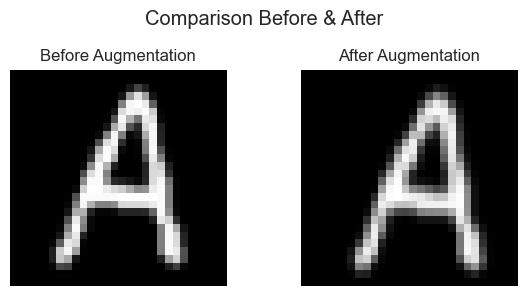

In [59]:
fig, ax = plt.subplots(1,2, figsize=(6, 3), tight_layout=True)
ax[0].imshow(x_train[random_class_idx], cmap='gray')
ax[0].axis('off')
ax[0].set_title('Before Augmentation')
ax[1].imshow(augmented_images[0], cmap='gray')
ax[1].set_title('After Augmentation')
ax[1].axis('off')

plt.suptitle('Comparison Before & After')
plt.show()

In [60]:
print(x_train.shape)
print(y_train.shape)

(88799, 28, 28, 1)
(88799,)


In [68]:
x_train_aug = np.array(augmented_images)  # Convert augmented_images to numpy array
x_train_concatenated = np.concatenate((x_train, (x_train_aug.reshape(-1,28,28,1))))
y_train_concatenated = np.concatenate((y_train, augmented_labels))  # Concatenate labels

# Shuffle the concatenated dataset
shuffle_indices = np.random.permutation(len(x_train_concatenated))
x_train_concatenated = x_train_concatenated[shuffle_indices]
y_train_concatenated = y_train_concatenated[shuffle_indices]


In [69]:
print(x_train_concatenated.shape)
print(y_train_concatenated.shape)

(179556, 28, 28, 1)
(179556,)


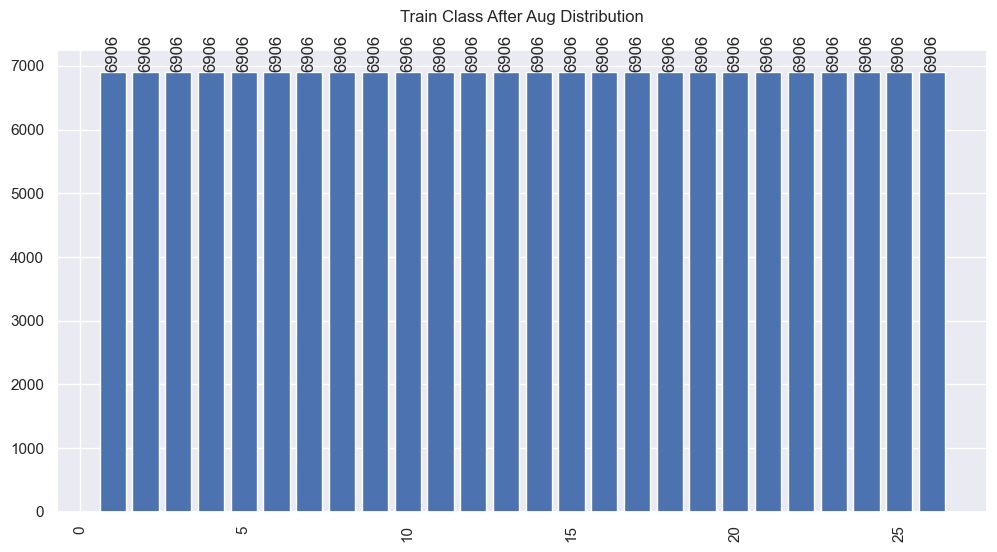

In [70]:
labels, counts = np.unique(y_train_concatenated, return_counts=True, )
plt.figure(figsize=(12, 6))
plt.bar(labels, counts)
for i in range(len(labels)):
    plt.text(labels[i], counts[i], str(counts[i]), ha='center', va='bottom', rotation=90)
plt.xticks(rotation=90)
plt.title('Train Class After Aug Distribution', pad='20')
plt.show()

In [77]:
# 3 Blocks ACGAN + Augmented Image
acgan = ACGAN(28, 28, 1, 26, blocks=3, dir=downloaddir, label=' + Augmentation')
acgan.train(
    train_images=scale(x_train_concatenated),
    train_labels=y_train_concatenated,
    epochs=25000,
    batch_size=256,
    save_interval=500,
)

Model: "Discriminator_3_Blocks"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 14, 14, 128)       1280      
                                                                 
 leaky_re_lu_10 (LeakyReLU)  (None, 14, 14, 128)       0         
                                                                 
 dropout_6 (Dropout)         (None, 14, 14, 128)       0         
                                                                 
 conv2d_9 (Conv2D)           (None, 7, 7, 128)         147584    
                                                                 
 leaky_re_lu_11 (LeakyReLU)  (None, 7, 7, 128)         0         
                                                                 
 dropout_7 (Dropout)         (None, 7, 7, 128)         0         
                                                                 
 conv2d_10 (Conv2D)          (None, 4, 4, 12